<a href="https://colab.research.google.com/github/SunitraS/EDA-MovieLens-1M-dataset/blob/main/ProjectFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Lib

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import pyplot as plt
import matplotlib
import seaborn as sns
from google.colab import files
import plotly.express as px
import re

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = [18, 8]

# Import Dataset

In [ ]:
unames=['UserID','Gender','Age','Occupation','Zip-code']
data_users = pd.read_csv('/content/drive/MyDrive/CC/users.dat', sep='::', header=None, names=unames)
data_users.to_csv ('users.csv', index=None)
data_users

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: ParserWarning:

Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.



,UserID,Gender,Age,Occupation,Zip-code
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455
...,...,...,...,...,...
6035,6036,F,25,15,32603
6036,6037,F,45,1,76006
6037,6038,F,56,1,14706
6038,6039,F,45,0,01060


In [ ]:
rnames=['UserID','MovieID','Rating','Timestamp']
data_ratings = pd.read_csv('/content/drive/MyDrive/CC/ratings.dat', sep='::', header=None, names=rnames)
data_ratings.to_csv ('ratings.csv', index=None)
data_ratings

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: ParserWarning:

Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.



,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291
...,...,...,...,...
1000204,6040,1091,1,956716541
1000205,6040,1094,5,956704887
1000206,6040,562,5,956704746
1000207,6040,1096,4,956715648


In [ ]:
mnames=['MovieID','Title','Genres']
data_movies = pd.read_csv('/content/drive/MyDrive/CC/movies.dat',sep='::' ,header=None, names=mnames,encoding='iso-8859-1 ')
data_movies.to_csv ('movies.csv', index=None)
data_movies

/usr/local/lib/python3.7/dist-packages/pandas/util/_decorators.py:311: ParserWarning:

Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.



,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
3878,3948,Meet the Parents (2000),Comedy
3879,3949,Requiem for a Dream (2000),Drama
3880,3950,Tigerland (2000),Drama
3881,3951,Two Family House (2000),Drama


# Clean Data

In [ ]:
ages_map = {1: 'Under 18',
            18: '18 - 24',
            25: '25 - 34',
            35: '35 - 44',
            45: '45 - 49',
            50: '50 - 55',
            56: '56+'}

occupations_map = {0: 'Not specified',
                   1: 'Academic / Educator',
                   2: 'Artist',
                   3: 'Clerical / Admin',
                   4: 'College / Grad Student',
                   5: 'Customer Service',
                   6: 'Doctor / Health Care',
                   7: 'Executive / Managerial',
                   8: 'Farmer',
                   9: 'Homemaker',
                   10: 'K-12 student',
                   11: 'Lawyer',
                   12: 'Programmer',
                   13: 'Retired',
                   14: 'Sales / Marketing',
                   15: 'Scientist',
                   16: 'Self-Employed',
                   17: 'Technician / Engineer',
                   18: 'Tradesman / Craftsman',
                   19: 'Unemployed',
                   20: 'Writer'}

gender_map = {'M': 'Male', 'F': 'Female'}

data_users['Age'] = data_users['Age'].map(ages_map)
data_users['Occupation'] = data_users['Occupation'].map(occupations_map)
data_users['Gender'] = data_users['Gender'].map(gender_map)

In [ ]:
data = data_ratings.merge(data_movies, on='MovieID', how='left').merge(data_users, on='UserID', how='left')

data

,UserID,MovieID,Rating,Timestamp,Title,Genres,Gender,Age,Occupation,Zip-code
0,1,1193,5,978300760,One Flew Over the Cuckoo's Nest (1975),Drama,Female,Under 18,K-12 student,48067
1,1,661,3,978302109,James and the Giant Peach (1996),Animation|Children's|Musical,Female,Under 18,K-12 student,48067
2,1,914,3,978301968,My Fair Lady (1964),Musical|Romance,Female,Under 18,K-12 student,48067
3,1,3408,4,978300275,Erin Brockovich (2000),Drama,Female,Under 18,K-12 student,48067
4,1,2355,5,978824291,"Bug's Life, A (1998)",Animation|Children's|Comedy,Female,Under 18,K-12 student,48067
...,...,...,...,...,...,...,...,...,...,...
1000204,6040,1091,1,956716541,Weekend at Bernie's (1989),Comedy,Male,25 - 34,Doctor / Health Care,11106
1000205,6040,1094,5,956704887,"Crying Game, The (1992)",Drama|Romance|War,Male,25 - 34,Doctor / Health Care,11106
1000206,6040,562,5,956704746,Welcome to the Dollhouse (1995),Comedy|Drama,Male,25 - 34,Doctor / Health Care,11106
1000207,6040,1096,4,956715648,Sophie's Choice (1982),Drama,Male,25 - 34,Doctor / Health Care,11106


In [ ]:
data['Timestamp'] = pd.to_datetime(data['Timestamp'],unit='s')
data.insert(4,"Year",data.Timestamp.map(lambda x: x.year),allow_duplicates=True)
data.insert(4,"Month",data.Timestamp.map(lambda x: x.month),allow_duplicates=True)

In [ ]:
data.head()

,UserID,MovieID,Rating,Timestamp,Month,Year,Title,Genres,Gender,Age,Occupation,Zip-code
0,1,1193,5,2000-12-31 22:12:40,12,2000,One Flew Over the Cuckoo's Nest (1975),Drama,Female,Under 18,K-12 student,48067
1,1,661,3,2000-12-31 22:35:09,12,2000,James and the Giant Peach (1996),Animation|Children's|Musical,Female,Under 18,K-12 student,48067
2,1,914,3,2000-12-31 22:32:48,12,2000,My Fair Lady (1964),Musical|Romance,Female,Under 18,K-12 student,48067
3,1,3408,4,2000-12-31 22:04:35,12,2000,Erin Brockovich (2000),Drama,Female,Under 18,K-12 student,48067
4,1,2355,5,2001-01-06 23:38:11,1,2001,"Bug's Life, A (1998)",Animation|Children's|Comedy,Female,Under 18,K-12 student,48067


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000209 entries, 0 to 1000208
Data columns (total 12 columns):
 #   Column      Non-Null Count    Dtype         
---  ------      --------------    -----         
 0   UserID      1000209 non-null  int64         
 1   MovieID     1000209 non-null  int64         
 2   Rating      1000209 non-null  int64         
 3   Timestamp   1000209 non-null  datetime64[ns]
 4   Month       1000209 non-null  int64         
 5   Year        1000209 non-null  int64         
 6   Title       1000209 non-null  object        
 7   Genres      1000209 non-null  object        
 8   Gender      1000209 non-null  object        
 9   Age         1000209 non-null  object        
 10  Occupation  1000209 non-null  object        
 11  Zip-code    1000209 non-null  object        
dtypes: datetime64[ns](1), int64(5), object(6)
memory usage: 99.2+ MB


# EDA



> **Movies**



*จำนวนหนังตามแต่ละประเภท*

In [ ]:
data_movies['Genres'] = data_movies['Genres'].apply(lambda x: x.split('|'))
movies_df_exploded = data_movies.explode('Genres')
px.histogram(movies_df_exploded, x='Genres', height=400, title='Movie count by genre').update_xaxes(categoryorder="total descending")

*จำนวนหนังที่ออกฉายในแต่ละปี*

In [ ]:
data_movies['Year'] = data_movies['Title'].apply(lambda movie_name: re.search('\((\d*)\)', movie_name).groups(1)[0])


In [ ]:
data_movies = data_movies.sort_values(by='Year',ascending=False)
data_movies

,MovieID,Title,Genres,Year
3882,3952,"Contender, The (2000)","[Drama, Thriller]",2000
3528,3597,Whipped (2000),[Comedy],2000
3577,3646,Big Momma's House (2000),[Comedy],2000
3170,3239,Isn't She Great? (2000),[Comedy],2000
3555,3624,Shanghai Noon (2000),[Action],2000
...,...,...,...,...
3240,3309,"Dog's Life, A (1920)",[Comedy],1920
3162,3231,"Saphead, The (1920)",[Comedy],1920
2754,2823,"Spiders, The (Die Spinnen, 1. Teil: Der Golden...","[Action, Drama]",1919
3063,3132,Daddy Long Legs (1919),[Comedy],1919


In [ ]:
movies_df_exploded = data_movies.explode('Year')
px.histogram(movies_df_exploded, x='Year', height=400, title='Movies released each year')

In [ ]:
data_movies['Year'] = pd.to_datetime(data_movies['Year'], format='%Y')
movie_year = pd.DataFrame(data_movies['Title'].groupby(data_movies['Year']).count())
movie_year.reset_index(inplace=True)

X=movie_year['Year']
Y=movie_year['Title']

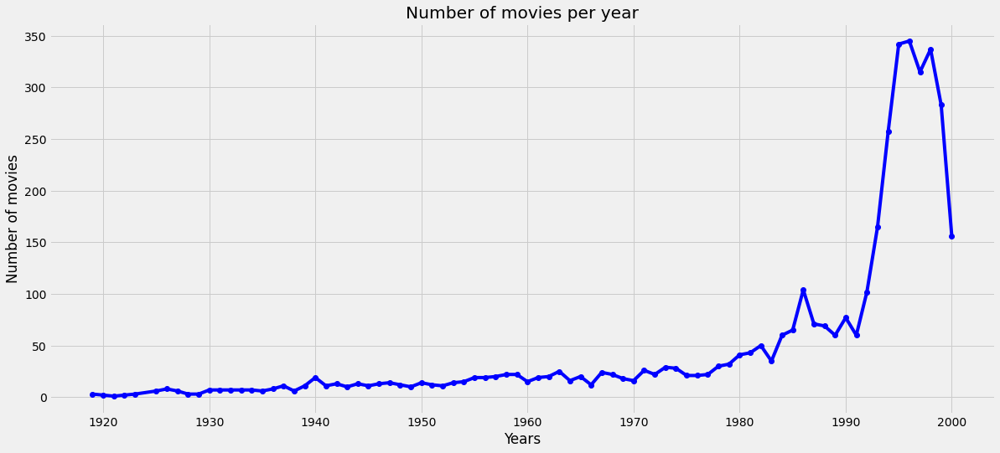

In [ ]:
plt.plot_date(X,Y,'bo-')
plt.grid(True)
plt.rcParams["figure.figsize"] = (15,5)
plt.title('Number of movies per year')
plt.xlabel('Years')
plt.ylabel('Number of movies')
plt.show()



---



*เรตติ้งเฉลี่ยของหนัง*

In [ ]:
rating_avg = data.groupby('Title')['Rating'].mean().to_frame()
rating_avg

,Rating
Title,
"$1,000,000 Duck (1971)",3.027027
'Night Mother (1986),3.371429
'Til There Was You (1997),2.692308
"'burbs, The (1989)",2.910891
...And Justice for All (1979),3.713568
...,...
"Zed & Two Noughts, A (1985)",3.413793
Zero Effect (1998),3.750831
Zero Kelvin (Kjærlighetens kjøtere) (1995),3.500000


In [ ]:
rating_avg = rating_avg.sort_values(by='Rating',ascending=False)
rating_avg

,Rating
Title,
Ulysses (Ulisse) (1954),5.0
Lured (1947),5.0
Follow the Bitch (1998),5.0
Bittersweet Motel (2000),5.0
Song of Freedom (1936),5.0
...,...
"Fantastic Night, The (La Nuit Fantastique) (1949)",1.0
Cheetah (1989),1.0
Torso (Corpi Presentano Tracce di Violenza Carnale) (1973),1.0




---



*จำนวนโหวตของหนัง*

In [ ]:
rating_count = data.groupby('Title')['Rating']
rating_count = rating_count.count().sort_values(ascending=False)
rating_count.to_frame()

,Rating
Title,
American Beauty (1999),3428
Star Wars: Episode IV - A New Hope (1977),2991
Star Wars: Episode V - The Empire Strikes Back (1980),2990
Star Wars: Episode VI - Return of the Jedi (1983),2883
Jurassic Park (1993),2672
...,...
Target (1995),1
I Don't Want to Talk About It (De eso no se habla) (1993),1
An Unforgettable Summer (1994),1


*เรียงตาม ค่า Rating*

In [ ]:
rating_avg_count = pd.DataFrame(data=rating_avg)
rating_avg_count['Rating_Count'] = pd.DataFrame(rating_count)
rating_avg_count

,Rating,Rating_Count
Title,,
Ulysses (Ulisse) (1954),5.0,1
Lured (1947),5.0,1
Follow the Bitch (1998),5.0,1
Bittersweet Motel (2000),5.0,1
Song of Freedom (1936),5.0,1
...,...,...
"Fantastic Night, The (La Nuit Fantastique) (1949)",1.0,1
Cheetah (1989),1.0,1
Torso (Corpi Presentano Tracce di Violenza Carnale) (1973),1.0,2


*เรียงตามค่าจำนวนโหวต*

In [ ]:
rating_avg_count = rating_avg_count.sort_values(by='Rating_Count',ascending=False)
rating_avg_count

,Rating,Rating_Count
Title,,
American Beauty (1999),4.317386,3428
Star Wars: Episode IV - A New Hope (1977),4.453694,2991
Star Wars: Episode V - The Empire Strikes Back (1980),4.292977,2990
Star Wars: Episode VI - Return of the Jedi (1983),4.022893,2883
Jurassic Park (1993),3.763847,2672
...,...,...
Detroit 9000 (1973),2.000000,1
Roula (1995),2.000000,1
Never Met Picasso (1996),2.000000,1


*Top 10 หนังที่มีจำนวนการโหวตมากที่สุด*

In [ ]:
rating_avg_count.head(10)

,Rating,Rating_Count
Title,,
American Beauty (1999),4.317386,3428
Star Wars: Episode IV - A New Hope (1977),4.453694,2991
Star Wars: Episode V - The Empire Strikes Back (1980),4.292977,2990
Star Wars: Episode VI - Return of the Jedi (1983),4.022893,2883
Jurassic Park (1993),3.763847,2672
Saving Private Ryan (1998),4.337354,2653
Terminator 2: Judgment Day (1991),4.058513,2649
"Matrix, The (1999)",4.315830,2590
Back to the Future (1985),3.990321,2583




---





> **User**



*เปอร์เซ็นเพศของ user*

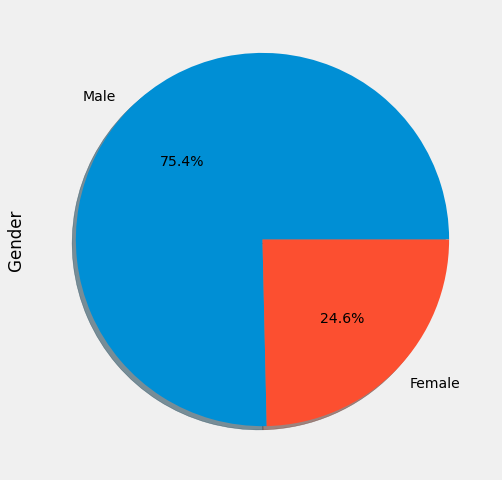

In [ ]:
data['Gender'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,figsize=(10,8))
plt.show()

*ช่วงอายุของ user*

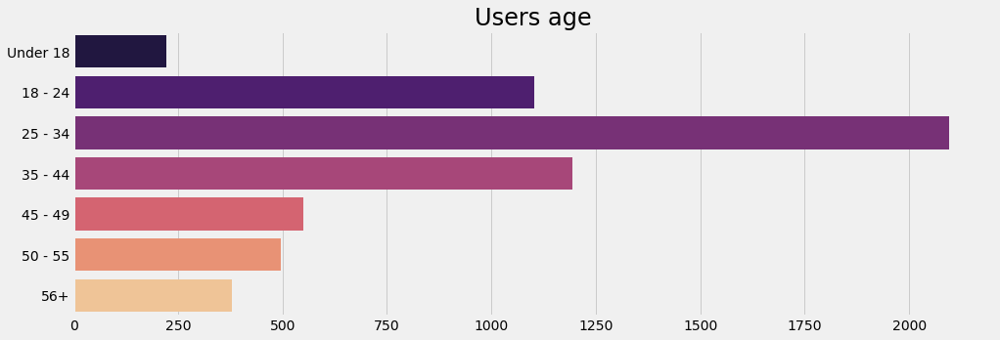

In [ ]:
age_reindex = ['Under 18', '18 - 24', '25 - 34', '35 - 44', '45 - 49', '50 - 55', '56+']

age_counts = data_users['Age'].value_counts().reindex(age_reindex)

sns.barplot(x=age_counts.values,
            y=age_counts.index,
            palette='magma').set_title('Users age', fontsize=24)

plt.show()



---



*Top 10 หนังที่แต่ละช่วงอายุรับชม*

In [ ]:
data[data['Age'] == 'Under 18']['Title'].value_counts()[:10].to_frame()

,Title
Toy Story (1995),112
"Sixth Sense, The (1999)",109
Star Wars: Episode IV - A New Hope (1977),101
Men in Black (1997),100
Star Wars: Episode VI - Return of the Jedi (1983),100
Toy Story 2 (1999),99
"Matrix, The (1999)",99
American Beauty (1999),92
Star Wars: Episode V - The Empire Strikes Back (1980),92
Star Wars: Episode I - The Phantom Menace (1999),91


In [ ]:
data[data['Age'] == '18 - 24']['Title'].value_counts()[:10].to_frame()

,Title
American Beauty (1999),715
Star Wars: Episode VI - Return of the Jedi (1983),586
Star Wars: Episode V - The Empire Strikes Back (1980),579
"Matrix, The (1999)",567
Star Wars: Episode IV - A New Hope (1977),562
Braveheart (1995),544
Saving Private Ryan (1998),543
Jurassic Park (1993),541
Terminator 2: Judgment Day (1991),529
"Sixth Sense, The (1999)",514


In [ ]:
data[data['Age'] == '25 - 34']['Title'].value_counts()[:10].to_frame()

,Title
American Beauty (1999),1334
Star Wars: Episode V - The Empire Strikes Back (1980),1176
Star Wars: Episode VI - Return of the Jedi (1983),1134
Star Wars: Episode IV - A New Hope (1977),1128
Terminator 2: Judgment Day (1991),1087
"Silence of the Lambs, The (1991)",1067
"Matrix, The (1999)",1049
Saving Private Ryan (1998),1017
Back to the Future (1985),1001
Jurassic Park (1993),1000


In [ ]:
data[data['Age'] == '35 - 44']['Title'].value_counts()[:10].to_frame()

,Title
Star Wars: Episode IV - A New Hope (1977),626
Star Wars: Episode V - The Empire Strikes Back (1980),598
American Beauty (1999),597
Star Wars: Episode VI - Return of the Jedi (1983),550
Back to the Future (1985),525
Terminator 2: Judgment Day (1991),524
Jurassic Park (1993),518
Raiders of the Lost Ark (1981),511
"Silence of the Lambs, The (1991)",510
Saving Private Ryan (1998),504


In [ ]:
data[data['Age'] == '45 - 49']['Title'].value_counts()[:10].to_frame()

,Title
American Beauty (1999),258
Star Wars: Episode IV - A New Hope (1977),243
Star Wars: Episode V - The Empire Strikes Back (1980),226
Jurassic Park (1993),218
Shakespeare in Love (1998),217
Back to the Future (1985),215
Star Wars: Episode VI - Return of the Jedi (1983),213
Schindler's List (1993),213
Saving Private Ryan (1998),211
Fargo (1996),209


In [ ]:
data[data['Age'] == '50 - 55']['Title'].value_counts()[:10].to_frame()

,Title
American Beauty (1999),248
Star Wars: Episode IV - A New Hope (1977),215
Star Wars: Episode V - The Empire Strikes Back (1980),206
Fargo (1996),199
"Godfather, The (1972)",198
Jurassic Park (1993),193
Back to the Future (1985),193
Star Wars: Episode VI - Return of the Jedi (1983),192
L.A. Confidential (1997),191
Braveheart (1995),191


In [ ]:
data[data['Age'] == '56+']['Title'].value_counts()[:10].to_frame()

,Title
American Beauty (1999),184
Schindler's List (1993),137
Shakespeare in Love (1998),136
"Godfather, The (1972)",122
Saving Private Ryan (1998),121
One Flew Over the Cuckoo's Nest (1975),119
Fargo (1996),118
"Silence of the Lambs, The (1991)",116
L.A. Confidential (1997),116
Star Wars: Episode IV - A New Hope (1977),116




---



*อาชีพส่วนใหญ่ของ user*

In [ ]:
data_users['Occupation'] = data_users['Occupation']
data_users = data_users.explode('Occupation')
px.histogram(data_users, x='Occupation', height=600, title='Occupation').update_xaxes(categoryorder="total descending")

*จำนวนการโหวตภาพยนต์ของแต่ละอาชีพ*

In [ ]:
df2=pd.DataFrame(data.groupby(["Occupation"]).size())
df2["Count"]=df2
del df2[0]
df2 = df2.sort_values(by=["Count"],ascending=False)
df2

,Count
Occupation,
College / Grad Student,131032
Not specified,130499
Executive / Managerial,105425
Academic / Educator,85351
Technician / Engineer,72816
Writer,60397
Programmer,57214
Artist,50068
Sales / Marketing,49109




> **Rating**





*เปอเซ็นต์เรทติ้งของหนังทั้งหมด*

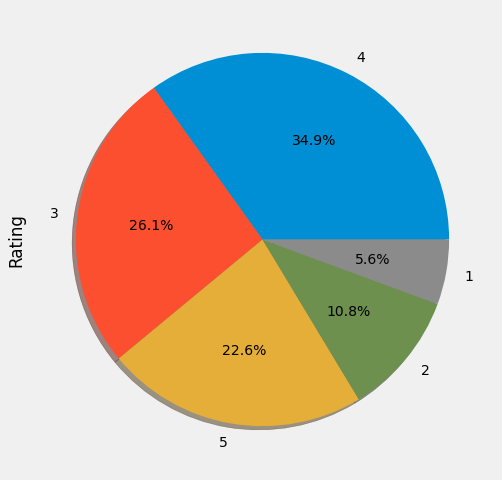

In [ ]:
data['Rating'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True,figsize=(10,8))
plt.show()

*แยกประเภทหนัง*

In [ ]:
data['Genres'].value_counts().to_frame()

,Genres
Comedy,116883
Drama,111423
Comedy|Romance,42712
Comedy|Drama,42245
Drama|Romance,29170
...,...
Drama|Romance|Western,29
Children's|Fantasy,27
Comedy|Film-Noir|Thriller,5
Film-Noir|Horror,2


In [ ]:
data['Genres'].unique()

array(['Drama', "Animation|Children's|Musical", 'Musical|Romance',
       "Animation|Children's|Comedy", 'Action|Adventure|Comedy|Romance',
       'Action|Adventure|Drama', 'Comedy|Drama',
       "Adventure|Children's|Drama|Musical", 'Musical', 'Comedy',
       "Animation|Children's", 'Comedy|Fantasy', 'Animation',
       'Comedy|Sci-Fi', 'Drama|War', 'Romance',
       "Animation|Children's|Musical|Romance",
       "Children's|Drama|Fantasy|Sci-Fi", 'Drama|Romance',
       'Animation|Comedy|Thriller',
       "Adventure|Animation|Children's|Comedy|Musical",
       "Animation|Children's|Comedy|Musical", 'Thriller',
       'Action|Crime|Romance', 'Action|Adventure|Fantasy|Sci-Fi',
       "Children's|Comedy|Musical", 'Action|Drama|War',
       "Children's|Drama", 'Crime|Drama|Thriller', 'Action|Crime|Drama',
       'Action|Adventure|Mystery', 'Crime|Drama',
       'Action|Adventure|Sci-Fi|Thriller',
       'Action|Adventure|Romance|Sci-Fi|War', 'Action|Thriller',
       'Action|Drama', 'Co

In [ ]:
movie_ratings_data = data[[
    'Gender',
    'Age',
    'Occupation',
    'Rating',
    'Genres'
]]

*ตารางแยกผลโหวตสำหรับหนังประเภทต่างๆ*

In [ ]:
Genre = movie_ratings_data['Genres']
Genre = Genre.str.get_dummies().add_prefix('Genres_')
movie_ratings_genres_df = pd.concat(
    [movie_ratings_data.drop(
        ['Genres'],
        axis=1
    ),
     Genre],
    axis=1,
)
movie_ratings_genres_df.head()

,Gender,Age,Occupation,Rating,Genres_Action,Genres_Adventure,Genres_Animation,Genres_Children's,Genres_Comedy,Genres_Crime,...,Genres_Fantasy,Genres_Film-Noir,Genres_Horror,Genres_Musical,Genres_Mystery,Genres_Romance,Genres_Sci-Fi,Genres_Thriller,Genres_War,Genres_Western
0,Female,Under 18,K-12 student,5,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Female,Under 18,K-12 student,3,0,0,1,1,0,0,...,0,0,0,1,0,0,0,0,0,0
2,Female,Under 18,K-12 student,3,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
3,Female,Under 18,K-12 student,4,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Female,Under 18,K-12 student,5,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
movie_ratings_genres_df.shape

(1000209, 22)



```
มี 1000209 ผลโหวต
```





---





> **User เพศหญิง**



In [ ]:
df2 = movie_ratings_genres_df.loc[movie_ratings_genres_df.Gender == 'Female']
df2.shape

(246440, 22)



```
 มีผู้หญิงโหวตทั้งหมด 246440 โหวต
```





---



*จำนวนการโหวตทั้งหมดของผู้หญิงในช่วงอายุต่าง ๆ*

In [ ]:
df2['Age'] = df2['Age']
df2 = df2.explode('Age')
px.histogram(df2, x='Age', height=600, title='Number of votes for women of different ages').update_xaxes(categoryorder="total descending")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df2

,Gender,Age,Occupation,Rating,Genres_Action,Genres_Adventure,Genres_Animation,Genres_Children's,Genres_Comedy,Genres_Crime,...,Genres_Fantasy,Genres_Film-Noir,Genres_Horror,Genres_Musical,Genres_Mystery,Genres_Romance,Genres_Sci-Fi,Genres_Thriller,Genres_War,Genres_Western
0,Female,Under 18,K-12 student,5,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Female,Under 18,K-12 student,3,0,0,1,1,0,0,...,0,0,0,1,0,0,0,0,0,0
2,Female,Under 18,K-12 student,3,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
3,Female,Under 18,K-12 student,4,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Female,Under 18,K-12 student,5,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999863,Female,45 - 49,Not specified,4,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
999864,Female,45 - 49,Not specified,3,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,0
999865,Female,45 - 49,Not specified,4,0,0,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
999866,Female,45 - 49,Not specified,4,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0




---



 *หาประเภทของหนังที่ผู้หญิงแต่ละช่วงอายุโหวตให้มากที่สุด
แปลงเป็น array และทำเป็น dataframe ใหม่*

In [ ]:
df2_women = df2.loc[df2.Age == 'Under 18']
df4 = df2_women.sum().to_frame()

my_array1 = np.array(df4.iloc[4:])

columns = ['Under 18']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

at1 = pd.DataFrame(my_array1,index,columns)

In [ ]:
df2_women = df2.loc[df2.Age == '18 - 24']
df5 = df2_women.sum().to_frame()

my_array2 = np.array(df5.iloc[4:])

columns = ['18 - 24']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

at2 = pd.DataFrame(my_array2,index,columns)

In [ ]:
df2_women = df2.loc[df2.Age == '25 - 34']
df6 = df2_women.sum().to_frame()

my_array3 = np.array(df6.iloc[4:])

columns = ['25 - 34']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

at3 = pd.DataFrame(my_array3,index,columns)

In [ ]:
df2_women = df2.loc[df2.Age == '35 - 44']
df7 = df2_women.sum().to_frame()

my_array4 = np.array(df7.iloc[4:])

columns = ['35 - 44']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

at4 = pd.DataFrame(my_array4,index,columns)

In [ ]:
df2_women = df2.loc[df2.Age == '45 - 49']
df8 = df2_women.sum().to_frame()

my_array5 = np.array(df8.iloc[4:])

columns = ['45 - 49']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

at5 = pd.DataFrame(my_array5,index,columns)

In [ ]:
df2_women = df2.loc[df2.Age == '50 - 55']
df9 = df2_women.sum().to_frame()

my_array6 = np.array(df9.iloc[4:])

columns = ['50 - 55']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

at6 = pd.DataFrame(my_array6,index,columns)

In [ ]:
df2_women = df2.loc[df2.Age == '56+']
df10 = df2_women.sum().to_frame()

my_array7 = np.array(df10.iloc[4:])

columns = ['56 +']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

at7 = pd.DataFrame(my_array7,index,columns)



---



*ตารางแสดงแต่ละช่วงอายุว่าผู้หญิงโหวตให้หนังประเภทไหนมากที่สุด*

In [ ]:
result_women = pd.concat([at1, at2,at3,at4,at5,at6,at7], axis=1, join='inner')
display(result_women)

,Under 18,18 - 24,25 - 34,35 - 44,45 - 49,50 - 55,56 +
Genres_Action,1343,8593,17147,9706,4608,2993,1260
Genres_Adventure,1230,5430,9597,5865,2648,1754,808
Genres_Animation,1010,3109,3847,2399,922,621,313
Genres_Children,2024,5234,6417,4305,1704,1137,496
Genres_Comedy,3860,19136,36883,18534,8481,6399,2978
Genres_Crime,365,2875,6310,3425,1601,1285,581
Genres_Documentary,25,235,819,419,203,167,72
Genres_Drama,2671,15977,37052,19239,10287,8237,4690
Genres_Fantasy,523,1934,3024,1772,782,492,191
Genres_Film-Noir,80,474,1374,1012,489,467,306


*กราฟแท่งเปรียบเทียบผลโหวต*

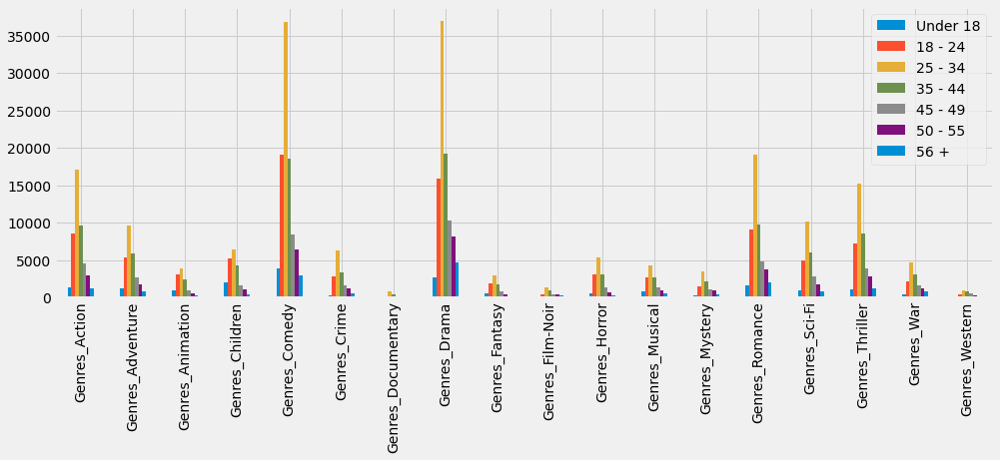

In [ ]:
result_women.plot(y=["Under 18", "18 - 24","25 - 34","35 - 44","45 - 49","50 - 55","56 +"], kind="bar")



---





> **User เพศชาย**



In [ ]:
df3 = movie_ratings_genres_df.loc[movie_ratings_genres_df.Gender == 'Male']
df3.shape

(753769, 22)



```
 มีผู้ชายโหวตทั้งหมด 753769 โหวต
```



In [ ]:
df3['Age'] = df3['Age']
df3 = df3.explode('Age')
px.histogram(df3, x='Age', height=600, title='Number of votes for men of different ages').update_xaxes(categoryorder="total descending")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df3_men = df3.loc[df3.Age == 'Under 18']
df4_m = df3_men.sum().to_frame()

my_array1_m = np.array(df4_m.iloc[4:])

columns = ['Under 18']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

mt1 = pd.DataFrame(my_array1_m,index,columns)

In [ ]:
df3_men = df3.loc[df3.Age == '18 - 24']
df5_m = df3_men.sum().to_frame()

my_array2_m = np.array(df5_m.iloc[4:])

columns = ['18 - 24']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

mt2 = pd.DataFrame(my_array2_m,index,columns)

In [ ]:
df3_men = df3.loc[df3.Age == '25 - 34']
df6_m = df3_men.sum().to_frame()

my_array3_m = np.array(df6_m.iloc[4:])

columns = ['25 - 34']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

mt3 = pd.DataFrame(my_array3_m,index,columns)

In [ ]:
df3_men = df3.loc[df3.Age == '35 - 44']
df7_m = df3_men.sum().to_frame()

my_array4_m = np.array(df7_m.iloc[4:])

columns = ['35 - 44']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

mt4 = pd.DataFrame(my_array4_m,index,columns)

In [ ]:
df3_men = df3.loc[df3.Age == '45 - 49']
df8_m = df3_men.sum().to_frame()

my_array5_m = np.array(df8_m.iloc[4:])

columns = ['45 - 49']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

mt5 = pd.DataFrame(my_array5_m,index,columns)

In [ ]:
df3_men = df3.loc[df3.Age == '50 - 55']
df9_m = df3_men.sum().to_frame()

my_array6_m = np.array(df9_m.iloc[4:])

columns = ['50 - 55']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

mt6 = pd.DataFrame(my_array6_m,index,columns)

In [ ]:
df3_men = df3.loc[df3.Age == '56+']
df10_m = df3_men.sum().to_frame()

my_array7_m = np.array(df10_m.iloc[4:])

columns = ['56 +']
index = ['Genres_Action','Genres_Adventure','Genres_Animation',
                                        'Genres_Children','Genres_Comedy','Genres_Crime','Genres_Documentary',
                                        'Genres_Drama','Genres_Fantasy','Genres_Film-Noir','Genres_Horror','Genres_Musical',
                                        'Genres_Mystery','Genres_Romance','Genres_Sci-Fi','Genres_Thriller','Genres_War','Genres_Western']

mt7 = pd.DataFrame(my_array7_m,index,columns)



---





In [ ]:
result_men = pd.concat([mt1, mt2,mt3,mt4,mt5,mt6,mt7], axis=1, join='inner')
display(result_men)

,Under 18,18 - 24,25 - 34,35 - 44,45 - 49,50 - 55,56 +
Genres_Action,5235,41593,88531,40797,14749,14019,6883
Genres_Adventure,2768,20894,43036,20817,8090,7336,3680
Genres_Animation,1439,7160,12607,5718,1967,1411,770
Genres_Children,2313,11690,19326,9699,3696,2753,1392
Genres_Comedy,7302,50844,106327,50710,19409,16734,8983
Genres_Crime,1336,12498,26720,11470,4447,4235,2393
Genres_Documentary,105,846,2670,1289,484,388,188
Genres_Drama,4812,42127,101643,52351,21854,21010,12579
Genres_Fantasy,837,5941,11266,5234,1913,1635,757
Genres_Film-Noir,250,1806,5165,3163,1371,1403,901


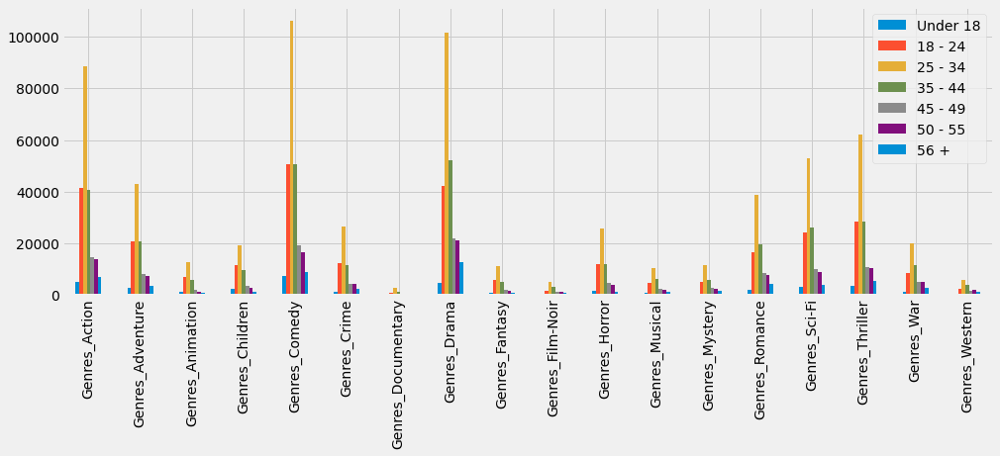

In [ ]:
result_men.plot(y=["Under 18", "18 - 24","25 - 34","35 - 44","45 - 49","50 - 55","56 +"], kind="bar")



---



# Result

จากการนำข้อมูลทั้งหมดจากชุดข้อมูลนี้มาวิเคราะห์ สรุปได้ดังนี้

ส่วนของภาพยนตร์
1. ภาพยนตร์ส่วนใหญ่เป็นประเภท Drama มีมากถึง 1603 เรื่องจากทั้งหมด 3883 เรื่อง
2. ปีที่ออกฉายภาพยนตร์มากที่สุดคือปี 1996 มีทั้งหมด 345 เรื่อง
3. การออกฉายภาพยนตร์เพิ่มขึ้นอย่างต่อเนื่องตั้งแต่ช่วงปี 1930 จนถึงปี 1996
ระหว่างปี 1970 ถึงปี 2000 มีจำนวนภาพยนตร์เพิ่มขึ้นสูงสุด เมื่อเทียบปีต่อปี และระหว่างปี 1992 - 1996 มีภาพยนตร์ที่ออกฉายเพิ่มมากขึ้นอย่างเห็นได้ชัด และหลังจากปี 1996 จำนวนภาพยนตร์ก็เริ่มลดลง

ส่วนของผู้ใช้งาน
1. ผู้ใช้งานทั้งหมดคือ 6040 คน เป็นเพศชาย 75% หรือ 4554 คน ซึ่งสรุปได้ว่า เพศชายนั้นให้ความสนใจในด้านภาพยนตร์มากกว่าเพศหญิง
2. ช่วงอายุของผู้ใช้งานจะอยู่ที่ 25 - 34 ปีมากที่สุด รองลงมาคือ 35 - 44 ปี และ 18 - 24 ปี หรือก็คือช่วงวัยรุ่นถึงวัยผู้ใหญ่
3. อาชีพส่วนใหญ่ของผู้ใช้งาน เนื่องจากผู้ใช้งานส่วนใหญ่อยู่ในช่วงวัยรุ่นถึงวัยผู้ใหญ่ อาชีพส่วนมากจึงเป็น นักเรียน/นักศึกษา ไม่ระบุ และ ผู้บริหาร
4. จากการทำตารางแสดง Top10ภาพยนตร์ของแต่ละช่วงอายุ สรุปได้ว่า ภาพยนตร์ที่ติดอันดับทุกช่วงอายุคือเรื่อง American Beauty และ ซีรีย์ Star Wars แม้จะติดอันดับทุกช่วงอายุ แต่อันดับ1ในแต่ละช่วงอายุต่างกัน ซึ่งแปลว่าแต่ละช่วงอายุนั้นชอบแนวภาพยนตร์ต่างกัน

เรตติ้ง
1. เปอเซ็นต์เรตติ้งของหนังทั้งหมดส่วนมากคือ 4 คะแนน 34.9%
เมื่อแยกการโหวตของเพศชาย/เพศหญิง สรุปได้ดังนี้

เพศหญิง
1. มีผู้ใช้งานเพศหญิงทั้งหมด 1486 คน จำนวนโหวต 246440 โหวต โดยช่วงอายุที่มีการโหวตมากที่สุดคือ 25 - 34 ปี ซี่งโหวตไปถึง 91340 โหวต
2. ประเภทภาพยนตร์ที่ผู้หญิงโหวตให้มากที่สุดคือ Drama รองลงมา คือ Comedy Romance Action และ Thiller ตามลำดับ
และประเภทของภาพยนตร์ที่แทบจะไม่มีผู้หญิงรับชมเลยคือ Documentary

เพศชาย
1. ผู้ใช้งานเพศชายทั้งหมด 4554 คน มีจำนวนโหวตทั้งหมด 753769 โหวต ช่วงอายุที่มีการโหวตมากที่สุดคือ 25 - 34 ปี โหวตไปมากถึง 304216 โหวต
2. ประเภทภาพยนตร์ที่ผู้ชายโหวตให้มากที่สุด คือ Comedy รองลงมาคือ Drama Action Thiller Sci-Fi Adventure และ Horror ตามลำดับ และประเภทของภาพยนตร์ที่แทบจะไม่มีผู้ชายรับชมเลยคือ Documentary


จากข้อสรุปด้านบน จะเห็นได้ว่าคะแนนโหวตของเพศชายจะกระจายมากกว่าเพศหญิง นั่นหมายความว่า ผู้ชายรับชมภาพยนตร์ได้หลากหลายแนวมากกว่าเพศหญิง ภาพยนตร์ประเภท Comedy Drama สามารถรับชมได้ทุกช่วงอายุ ทั้งเพศชายและเพศหญิง และประเภทภาพยนตร์ที่แทบจะไม่มีคนโหวตเลยคือ Documentary
